# Graphs Topo Tests

In [1]:
include("../src/networks/Network-Graphs.jl")
include("../src/networks/Network-Visualization.jl")

graph_context (generic function with 1 method)

In [2]:
e = Edge(1,2)
struct NoContent <: MessageContent end
Letter(e, echo, NoContent())

Letter{Int64, NoContent}(Edge 1 => 2, echo, NoContent())

In [3]:
g = create_random_topology(3,2)
g = create_small_world_topology(50)
Network{Int64}(g)

Network{Int64}({50, 100} undirected simple Int64 graph, Queue{Letter}(Deque [Letter[]]))

In [4]:
fgp = FixedGraphPlot{Int64}(g)

FixedGraphPlot{Int64}({50, 100} undirected simple Int64 graph, [-0.9761317863855467, -0.8280809701950456, -0.7765064780276645, -0.4219336835160735, -0.542311900016236, -0.2518307031259206, -0.28565146719109813, 0.10747000351050362, 0.5463225891564987, 0.4056739634698472  …  0.35113477336434706, -0.12844529127386595, 0.20356803116348665, -0.41357666749638733, -0.0875573766026907, -0.7818813984772653, -0.6411272868727613, -0.9326637226753538, -0.9386587009601258, -1.0], [-0.2012568908538519, -0.37819766966169144, -0.5093562312627873, -0.672291234941087, -0.6049844739383511, -0.5539389916435471, -0.48924900070052313, -0.49919919445553185, -0.3876026949242911, -0.6463555626661986  …  0.13881861450696165, 0.47404310576076214, 0.49226812705440337, 0.6468513380184289, 0.6558908384235242, 0.5682232846836084, 0.4562159102375827, 0.320935596464774, 0.151494640227811, -0.030975919879403402], 0.035355339059327376, [1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  41, 42, 43, 44, 45, 46, 47, 48, 49, 50], RGB{Fixe

# Test of Echo Algorithm

In [5]:
include("../src/EchoVisualization.jl")

_echo_edges_visualization! (generic function with 1 method)

In [6]:
struct TestContent <: MessageContent end
struct Swallow <: StopContent end
cb_test(content::Letter{Int64,TestContent}) = TestContent()
cb_stop(content::Letter{Int64,Swallow}) = StopContent()

cb_stop (generic function with 1 method)

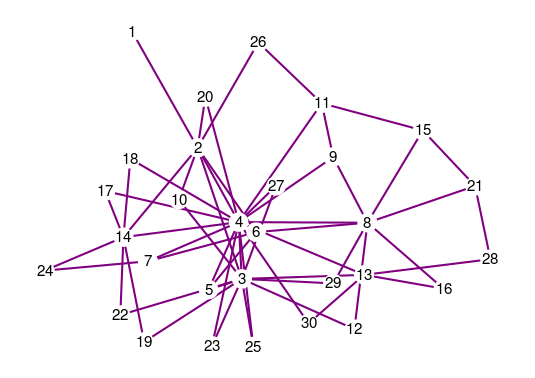

In [7]:
number_of_nodes = 30
g = create_scale_free_topology(number_of_nodes)
initiator = 1
echo_alg = EchoAlgorithm{Int64}(g, initiator)
init_echo_algorithm!(echo_alg, TestContent())
fgp = FixedGraphPlot{Int64}(g)
gc = graph_context(fgp)

In [8]:
anim = Animation()
frame(anim, gc)
i = 0
while !has_terminated(echo_alg)
    i += 1
    echo_algorithm_step!(echo_alg, cb_test)
    echo_visualization!(fgp, echo_alg)
    gc = graph_context(fgp)
    frame(anim, gc)
end
"$i steps"

"113 steps"

┌ Info: Saved animation to 
│   fn = /home/tom/Uni/dist-algorithms/test/echo_tests.gif
└ @ Plots /home/tom/.julia/packages/Plots/9C6z9/src/animation.jl:114


Plots.AnimatedGif("/home/tom/Uni/dist-algorithms/test/echo_tests.gif")
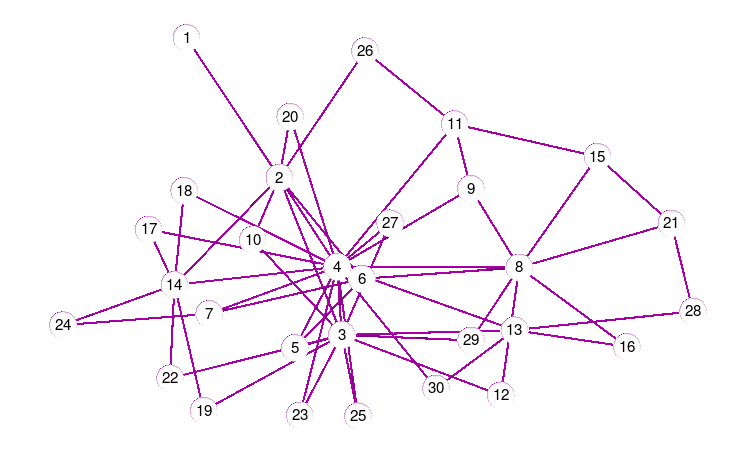

In [9]:
gif(anim, "echo_tests.gif", fps = 1)

# Tests of Election Algorithm

In [10]:
include("../src/ElectionVisualization.jl")
using StatsBase:sample

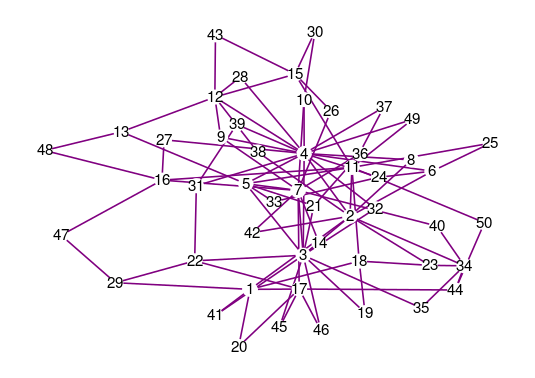

In [11]:
number_of_nodes = 50
g = create_scale_free_topology(number_of_nodes)
process_ids = collect(5001:5050)
initiators = collect(5030:5039)

elec_alg = ElectionAlgorithm{Int64}(g, process_ids, initiators)
echo_alg = elec_alg.echo_algorithms[argmax(initiators)]
init_election_algorithm!(elec_alg)
fgp = FixedGraphPlot{Int64}(g)
gc = graph_context(fgp)

In [12]:
anim = Animation()
frame(anim, gc)
i = 0
while !has_winner(elec_alg)
    i += 1
    election_algorithm_step!(elec_alg)
    echo_visualization!(fgp, echo_alg)
    gc = graph_context(fgp)
    frame(anim, gc)
end
"$i steps"

"194 steps"

In [13]:
election_algorithm_step!(elec_alg)
echo_visualization!(fgp, echo_alg)
gc = graph_context(fgp)
frame(anim, gc)

196-element Vector{String}:
 "000001.png"
 "000002.png"
 "000003.png"
 "000004.png"
 "000005.png"
 "000006.png"
 "000007.png"
 "000008.png"
 "000009.png"
 "000010.png"
 "000011.png"
 "000012.png"
 "000013.png"
 ⋮
 "000185.png"
 "000186.png"
 "000187.png"
 "000188.png"
 "000189.png"
 "000190.png"
 "000191.png"
 "000192.png"
 "000193.png"
 "000194.png"
 "000195.png"
 "000196.png"

┌ Info: Saved animation to 
│   fn = /home/tom/Uni/dist-algorithms/test/elec_sim_test.gif
└ @ Plots /home/tom/.julia/packages/Plots/9C6z9/src/animation.jl:114


Plots.AnimatedGif("/home/tom/Uni/dist-algorithms/test/elec_sim_test.gif")
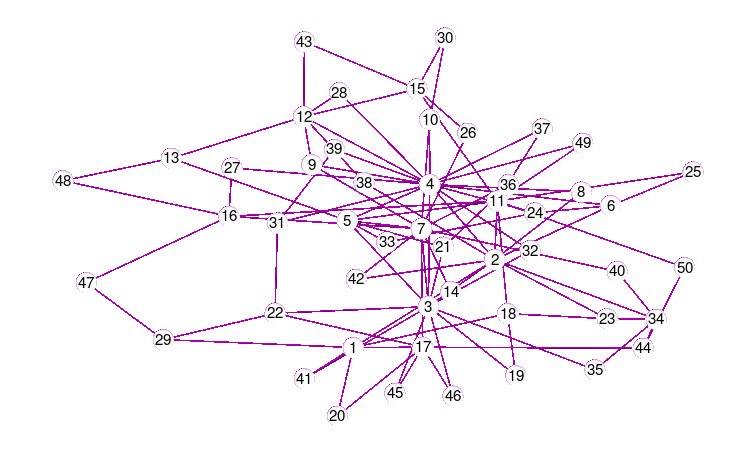

In [14]:
gif(anim, "elec_sim_test.gif", fps = 1)

# Test Election Visualization

In [15]:
include("../src/ElectionVisualization.jl")
using StatsBase:sample

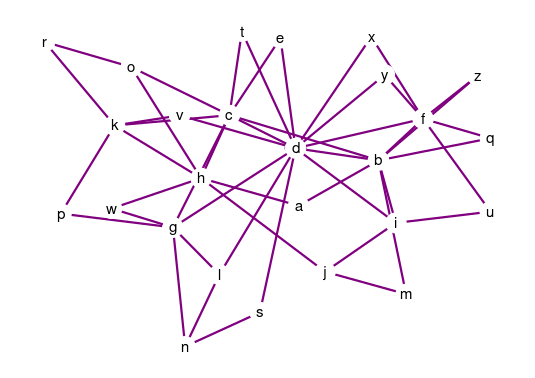

In [16]:
number_of_nodes, number_of_initiators = 26, 15
g = create_scale_free_topology(number_of_nodes)
processlabels = 'a':'z'
process_ids = Int64.(processlabels)
processlabels = ["$c" for c in processlabels]
process_id_label_map = Dict(i => c for (i,c) in zip(process_ids, processlabels))
initiators = sample(process_ids, number_of_initiators, replace = false)
elec_alg = ElectionAlgorithm{Int64}(g, process_ids, initiators)
init_election_algorithm!(elec_alg)
elec_fgp = FixedGraphPlot{Int64}(g, nodelabels=processlabels)
elec_gc = graph_context(elec_fgp)

In [17]:
for i in initiators
    println(i, process_id_label_map[i])
end
i = maximum(initiators)
println("----------------")
println(i, process_id_label_map[i])

108l
105i
104h
113q
115s
112p
100d
106j
102f
122z
107k
119w
118v
120x
110n
----------------
122z


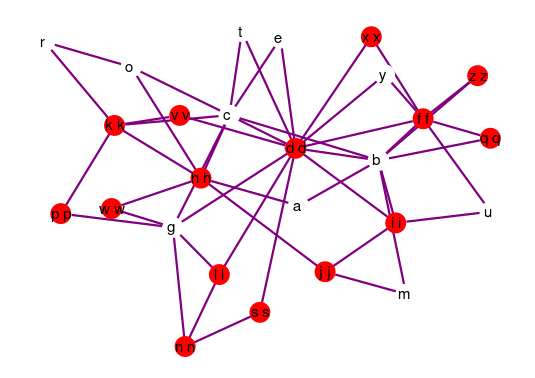

In [18]:
election_visualization!(elec_fgp, elec_alg, process_id_label_map)
elec_gc = graph_context(elec_fgp)

In [19]:
i = 0
while !has_winner(elec_alg)
    i += 1
    election_algorithm_step!(elec_alg)
end
i

98

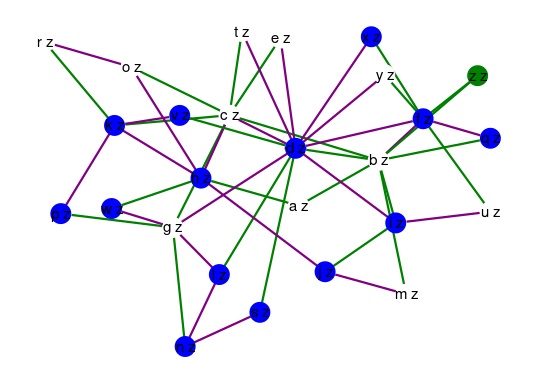

In [20]:
election_algorithm_step!(elec_alg)
election_visualization!(elec_fgp, elec_alg, process_id_label_map)
elec_gc = graph_context(elec_fgp)